# Τεχνολογία και Ανάλυση Εικόνων και Βίντεο

## 3η εργαστηριακή άσκηση



## Θεωρητικό Μέρος
Σύμφωνα με τα δημοσιευθέντα άρθρα : 
* [You Only Look Once:Unified, Real-Time Object Detection](https://arxiv.org/pdf/1506.02640.pdf) των Joseph Redmon, Santosh Divvala,  Ross Girshick, και Ali Farhadi
* [YOLOv3: An Incremental Improvement](https://arxiv.org/pdf/1804.02767.pdf) των Joseph Redmon και Ali Farhadi
* [SIMPLE ONLINE AND REALTIME TRACKING](https://arxiv.org/pdf/1602.00763.pdf]) των Alex Bewley, Zongyuan Ge, Lionel Ott, Fabio Ramos και Ben Upcroft

### 1)
Στον αλγόριθμο **YOLO**, 
* To **bounding box** είναι ένα ορθογώνιο παραλληλόγραμμο, το οποίο χρησιμοποιείται για την περιγραφή χωρικής πληροφορίας στην εικόνα, για παράδειγμα περικλείει τα pixel που αντιστοιχούν σε αντικείμενα κλάσης στην εικόνα. Συγκεκριμένα, αποτελείται από 4 παραμέτρους ($b_{x}$, $b_{y}$, $b_{h}$,$b_{w}$)-(x_center_coordinate, y_center_coordinate, height, width), που καθορίζουν τη θέση του στην εικόνα και τις διαστάσεις του.
\begin{align}
    y &= \begin{bmatrix}
           p_{c} \\
           \color{blue}{\text{$b_{x}$}} \\
           \color{blue}{\text{$b_{y}$}} \\
           \color{blue}{\text{$b_{h}$}} \\
           \color{blue}{\text{$b_{w}$}} \\
           c_{1} \\
           c_{2} \\
           c_{3} \\
         \end{bmatrix}
  \end{align}
* Το **anchor box** είναι ένα σετ από bounding boxes, όπως στον ακόλουθο πίνακα όπου οι μεταβλητές με χρώμα μπλε ανήκουν σε διαφορετικό anchor box από αυτές με χρώμα κόκκινο. Αυτά χρησιμοποιούνται για την ανίχνευση παραπάνω από ένα αντικείμενα κλάσης σε ένα grid cell.

\begin{align}
    y &= \begin{bmatrix}
           \color{blue}{\text{$p_{c}$}} \\
           \color{blue}{\text{$b_{x}$}} \\
           \color{blue}{\text{$b_{y}$}} \\
           \color{blue}{\text{$b_{h}$}} \\
           \color{blue}{\text{$b_{w}$}} \\
           \color{blue}{\text{$c_{1}$}} \\
           \color{blue}{\text{$c_{2}$}} \\
           \color{blue}{\text{$c_{3}$}} \\
           \color{red}{\text{$p_{c}$}} \\
           \color{red}{\text{$b_{x}$}} \\
           \color{red}{\text{$b_{y}$}} \\
           \color{red}{\text{$b_{h}$}} \\
           \color{red}{\text{$b_{w}$}} \\
           \color{red}{\text{$c_{1}$}} \\
           \color{red}{\text{$c_{2}$}} \\
           \color{red}{\text{$c_{3}$}} \\
         \end{bmatrix}
  \end{align}

### 2)
Στον αλγόριθμο **YOLO**, οι διαστάσεις του πίνακα εξόδου έχουν την μορφή της ακόλουθης εικόνας, αποτελούμενη από τις ακόλουθες μεταβλητές :
* $p_{c}$ : δείκτης που ποσοτικοποιεί αν υπάρχει κάτι για ανίχνευση ή όχι (παίρνει τιμή από 0 έως 1)
* $b_{x}$ $b_{y}$ $b_{h}$ $b_{w}$ : οι συντεταγμένες του bounding box
* $c_{1}$ ... $c_{n}$ : οι κλάσεις στις οποίες θα ταξινομηθούν τα αντικείμενα (παίρνει τιμή 1 εκεί στην κλάση που ταξινομήθηκε και 0 στις υπόλοιπες)
\begin{align}
    y &= \begin{bmatrix}
           p_{c} \\
           b_{x} \\
           b_{y} \\
           b_{h} \\
           b_{w} \\
           c_{1} \\
           ... \\
           c_{n} \\
         \end{bmatrix}
  \end{align}

  Επίσης, όπως εξηγήθηκε προηγουμένως τα anchor boxes είναι σετ από bounding boxes. Επομένως, οι διαστάσεις του πίνακα εξόδου (πρόβλεψης) y_hat του αλγορίθμου YOLO, θεωρώντας ότι έχουμε 2 anchor boxes και 3 κλάσεις, είναι 16x1 όπως φαίνεται ακολούθως :
\begin{align}
    y &= \begin{bmatrix}
           p_{c} \\
           b_{x} \\
           b_{y} \\
           b_{h} \\
           b_{w} \\
           c_{1} \\
           ... \\
           c_{n} \\
           p_{c} \\
           b_{x} \\
           b_{y} \\
           b_{h} \\
           b_{w} \\
           c_{1} \\
           ... \\
           c_{n} \\
         \end{bmatrix}
  \end{align}

### 3)
Ένα από τα συνηθέστερα προβλήματα στην αναγνώριση αντικειμένων είναι η πολλαπλή αναγνώριση ενός αντικειμένου, δηλαδή η δημιουργία πολλών bounding boxes για το ίδιο αντικείμενο. Στον αλγόριθμο **YOLO**, η μέθοδος **non-max suppression** επιλύει αυτό το πρόβλημα επιλέγοντας ένα bounding box ανά αντικείμενο, ακολουθώντας τα παρακάτω βήματα :
* Πρώτα, επιλέγει το bounding box με την μεγαλύτερη πιθανότητα ανίχνευσης, ανάμεσα στα γειτονικά bounding boxes, που αντιστοιχούν στο ίδιο αντικείμενο
* Ύστερα, ελέγχει την IoU των άλλων bounding boxes με το τρέχων. Bounding boxes με υψηλό IoU συμπτίσσονται
* Η διαδικασία αυτή γίνεται επαναληπτικά μέχρι να καταλήξουμε σε ένα bounding box

**Intersection over Union (Evaluating Object Detection)** : το bounding box το οποίο έγινε predicted από τον αλγόριθμο YOLO συγκρίνεται με το πραγματικό (ground truth) σύμφωνα με τη μέθοδο Intersection over union. Σωστή πρόβλεψη συνήθως θεωρείτε αυτή με IoU >= 0.5. 
<h3 align="center">IoU = $\frac{Area of Overlap}{Area of Union}$</h3>



### 4)
Στον αλγόριθμο **SORT** (Simple Online and Real-Time Tracking) το matching των αντικειμένων γίνεται με τον **Hungarian αλγόριθμο**. O Hungarian αλγόριθμος συσχετίζει αντικείμενα του τρέχοντος frame με το προηγούμενο σύμφωνα με το bounding boxes distance. Το bounding boxes distance είναι η "απόσταση", που έχουν τα bounding boxes ίδιου αντικειμένου σε διαδοχικά frames, στην ουσία είναι το σκορ που πετυχαίνουν σε κάποιες μετρικές, όπως είναι η IoU, Shape Score, Convolutional Cost. Στον αλγόριθμο SORT χρησιμοποιείται ο Hungarian αλγόριθμος με την IoU όπου υπολογίζεται το ελάχιστο κόστος της Intersection over union απόστασης μεταξύ κάθε detection και όλων των predicted bounding boxes. 

### 5)
Η μέθοδος του **tracking-by-detection** είναι ευρέως διαδεδομένη στα προβλήματα Multi-Object-Tracking (MOT). Αποτελείται από 3 components : 
* **Tracker** : Το στοιχείο παρακολούθησης που προβλέπει τη θέση ενός αντικειμένου με βάση την εκτίμηση της κίνησης μεταξύ διαδοχικών καρέ. Επιπλέον, αποτελεί το component όπου χρησιμοποιείται βαθιά μάθηση (deep learning).
* **Detector** : Ο ανιχνευτής εκτελεί τη σάρωση της εικόνας και ταξινομεί κάθε ενημέρωση κώδικα για αποδοχή ή απόρριψη με βάση την παρουσία αντικειμένου
* **Learning** : Η μονάδα εκμάθησης αρχικοποιεί τον ανιχνευτή στο πρώτο πλαίσιο, εκτιμά το σφάλμα ανιχνευτή και δημιουργεί θετικά και αρνητικά παραδείγματα για να ενημερώσει τον ανιχνευτή αντικειμένων

## Εργαστηριακό μέρος

### Load Requirments

In [ ]:
import sys
!{sys.executable} -m pip install torch==1.5.0 torchvision==0.6.0


In [ ]:
!{sys.executable} -m pip install matplotlib
!{sys.executable} -m pip install pillow
!{sys.executable} -m pip install filterpy==1.4.5
!{sys.executable} -m pip install scikit-image==0.17.2
!{sys.executable} -m pip install lap==0.4.0

Mount to google drive.
Το κάνουμε αυτό για έχουμε πρόσβαση στα python modules που χρειαζόμαστε.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Για να μπορέσετε να έχετε πρόσβαση σε όλα τα αρχεία του φακέλου Lab_motion_tracking_exercise θα πρέπει πριν τρέξετε το παρακάτω κελί να πατε στο drive του εργαστηρίου, να κάνετε δεξί κλικ στο Lab_motion_tracking_exercise, να πατήσετε Add a shortcut to drive και μετά να πατήσετε My Drive.

In [ ]:
import sys
import os 
sys.path.insert(0,'/content/drive/My Drive/Lab_motion_tracking_exercise') 
print(os.listdir('/content/drive/My Drive/Lab_motion_tracking_exercise')) # Έλεγχος ότι έχουμε όλα τα απαραίτητα αρχεία

['config', 'images', 'utils', 'models.py', 'road_trafifc.mp4', 'sort.py', '__pycache__', 'Object_Detection_and_Tracking.ipynb']


Φορτώνουμε τις απαραίτητες βιβλιοθήκες

In [ ]:
###########################
""" Importing Libraries """
###########################
from models import *
from utils import *
from sort import *

from models import Darknet
from utils import utils

import os, sys, time, datetime, random
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torch.autograd import Variable

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from PIL import Image

import cv2
from IPython.display import clear_output
# initialize Sort object and video capture
from sort import Sort

def simplePlotarisma(graphima, titlos, x_etiketa, y_etiketa):
  plt.plot(graphima)
  plt.title(titlos)
  plt.xlabel(x_etiketa)
  plt.ylabel(y_etiketa)
  plt.show()
  return None

def doublePlotarisma(graphima_1, graphima_2, label_1, label_2, titlos, x_etiketa, y_etiketa):
  plt.plot(graphima_1, label = label_1)
  plt.plot(graphima_2, label = label_2)
  plt.title(titlos)
  plt.xlabel(x_etiketa)
  plt.ylabel(y_etiketa)
  #plt.ylim([0.5, 1])
  plt.legend(loc='best')
  plt.show()
  return None

def Plotarisma_InSame(graphimata, labels, titlos, x_etiketa, y_etiketa):
  for i in range(0,len(graphimata)):
    plt.plot(graphimata[i], label=labels[i])
  plt.title(titlos)
  plt.xlabel(x_etiketa)
  plt.ylabel(y_etiketa)
  plt.legend(loc='best')
  plt.show()
  return None

#def to show image
def plotIMG(eikona, titlos, BarOrNot):
  im = plt.imshow(eikona) 
  plt.title(titlos)
  if(BarOrNot):
    bar = plt.colorbar(im)
  plt.show()
  return None

#def to show image in grayscale
def grayIMG(eikona, titlos, BarOrNot):
  im = plt.imshow(eikona, cmap = 'gray') 
  plt.title(titlos)
  if(BarOrNot):
    gray_bar = plt.colorbar(im)
  plt.show()
  return None

#def to show image in grayscale
def grayRevIMG(eikona, titlos, BarOrNot):
  im = plt.imshow(eikona, cmap = 'gray_r') 
  plt.title(titlos)
  if(BarOrNot):
    grayr_bar = plt.colorbar(im)
  plt.show()
  return None


def multiple_Plots_in_One(all_plots, Titles, rows, columns):
    
    #creating the fig
    fig = plt.figure(figsize=(18, 18))
    #fig = plt.figure()

    for i in range(0,len(all_plots)):
      fig.add_subplot(rows, columns, i+1)
      plt.plot(all_plots[i])
      plt.title(Titles[i])
    
    fig.tight_layout(pad=1.0)
    #fig.suptitle('Samples for each label')
    plt.show()
    return None

def multiple_Plots_in_One2(all_plots_1, all_plots_2, Titles, rows, columns):
    
    #creating the fig
    fig = plt.figure(figsize=(8, 8))
    #fig = plt.figure()

    for i in range(0,len(all_plots_1)):
      fig.add_subplot(rows, columns, i+1)
      plt.plot(all_plots_1[i])
      plt.plot(all_plots_2[i])
      plt.title(Titles[i])
    
    fig.tight_layout(pad=1.0)
    #fig.suptitle('Samples for each label')
    plt.show()
    return None

def oneBarPlot(Graph_Names, Graph, polichromo, x_label, y_label, Title):
  plt.bar(Graph_Names, Graph, color=polichromo)
  plt.xlabel(x_label)
  plt.ylabel(y_label)
  plt.title(Title)
  plt.show()
  return None

def twoBarsPlot(bara_1, bara_2, Graph_Names, Leganda, y_label, Title):
  x_len = np.arange(len(Graph_Names))
  w_bar = 0.36
  plt.bar(x_len-(w_bar/2), bara_1, width = w_bar)
  plt.bar(x_len+(w_bar/2), bara_2, width = w_bar)
  #plt.xlabel("Estimators used")
  plt.xticks(x_len, labels = Graph_Names)
  plt.ylabel(y_label)
  plt.legend(Leganda,loc='best')
  plt.title(Title)
  plt.show()
  return None

In [ ]:
import os
print(os.getcwd())

/content


In [ ]:
#####################################
""" All the Requirments in a cell """
#####################################

def detect_image(image, image_size, model, conf_threshold, nms_threshold):
  # scale and pad image
  ratio = min(image_size/image.size[0], image_size/image.size[1])
  imw = round(image.size[0] * ratio)
  imh = round(image.size[1] * ratio)
  image_transforms = transforms.Compose([transforms.Resize((imh, imw)), 
                                         transforms.Pad((max(int((imh-imw)/2),0), max(int((imw-imh)/2),0), max(int((imh-imw)/2),0), max(int((imw-imh)/2),0)),(128,128,128)),
                                         transforms.ToTensor()])
  
  # convert image to Tensor
  image_tensor = image_transforms(image).float()
  image_tensor = image_tensor.unsqueeze_(0)
  input_img = Variable(image_tensor.type(Tensor))
  
  # run inference on the model and get detections
  with torch.no_grad():
    detections = model(input_img)
    detections = utils.non_max_suppression(detections, 80, conf_threshold, nms_threshold)
  
  return detections[0]

#----------------------------------------------------------------------------------------------------------------------------------#
#----------------------------------------------------------------------------------------------------------------------------------#

def get_bounding_boxes(detections, image, image_size):
  # Get bounding-box colors
  cmap = plt.get_cmap('tab20b')
  colors = [cmap(i) for i in np.linspace(0, 1, 20)]

  image = np.array(image)
  plt.figure()
  fig, ax = plt.subplots(1, figsize=(12,9))
  ax.imshow(image)

  pad_x = max(image.shape[0] - image.shape[1], 0) * (image_size / max(image.shape))
  pad_y = max(image.shape[1] - image.shape[0], 0) * (image_size / max(image.shape))
  unpad_h = image_size - pad_y
  unpad_w = image_size - pad_x

  if detections is not None:
    unique_labels = detections[:, -1].cpu().unique()
    n_cls_preds = len(unique_labels)
    bbox_colors = random.sample(colors, n_cls_preds)
    # browse detections and draw bounding boxes
    for x1, y1, x2, y2, conf, cls_conf, cls_pred in detections.cpu():
      box_h = ((y2 - y1) / unpad_h) * image.shape[0]
      box_w = ((x2 - x1) / unpad_w) * image.shape[1]
      y1 = ((y1 - pad_y // 2) / unpad_h) * image.shape[0]
      x1 = ((x1 - pad_x // 2) / unpad_w) * image.shape[1]
      color = bbox_colors[int(np.where(unique_labels == int(cls_pred))[0])]
      bbox = patches.Rectangle((x1, y1), box_w, box_h, linewidth=2, edgecolor=color, facecolor='none')
      ax.add_patch(bbox)
      plt.text(x1, y1, s=classes[int(cls_pred)], color='white', verticalalignment='top',bbox={'color': color, 'pad': 0})
  plt.axis('off')
  # save image
  #plt.savefig(img_path.replace(".jpg", "-det.jpg"), bbox_inches='tight', pad_inches=0.0)
  plt.show()
  return None

def value_parameters(detections):
  conf_mean = detections[:, -3].cpu().mean()
  conf_mean_list = [conf_mean for _ in range(len(detections[:, -3].cpu()))]
  print('----------------------------------------------------------------')
  #simplePlotarisma(detections[:, -3].cpu(), "Confidence Per Bounding Box"," "," ")
  doublePlotarisma(detections[:, -3].cpu(), conf_mean_list, "Confidence", "Mean Confidence", "Confidence Per Bounding Box"," "," ")

  cls_pred_mean = detections[:, -2].cpu().mean()
  cls_pred_mean_list = [cls_pred_mean for _ in range(len(detections[:, -2].cpu()))]
  print('----------------------------------------------------------------')
  #simplePlotarisma(detections[:, -2].cpu(), "Accuracy of Class Prediction Per Bounding Box"," "," ")
  doublePlotarisma(detections[:, -2].cpu(), cls_pred_mean_list, "Accuracy", "Mean Accuracy", "Accuracy of Class Prediction Per Bounding Box"," "," ")

  return None 

def value_parameters_2(tracked_obj):
  conf_mean = np.mean(tracked_obj[:, -3])
  conf_mean_list = [conf_mean for _ in range(len(tracked_obj[:, -3]))]
  print('----------------------------------------------------------------')
  #simplePlotarisma(detections[:, -3].cpu(), "Confidence Per Bounding Box"," "," ")
  doublePlotarisma(tracked_obj[:, -3], conf_mean_list, "Confidence", "Mean Confidence", "Confidence Per Bounding Box"," "," ")

  cls_pred_mean = np.mean(tracked_obj[:, -2])
  cls_pred_mean_list = [cls_pred_mean for _ in range(len(tracked_obj[:, -2]))]
  print('----------------------------------------------------------------')
  #simplePlotarisma(detections[:, -2].cpu(), "Accuracy of Class Prediction Per Bounding Box"," "," ")
  doublePlotarisma(tracked_obj[:, -2], cls_pred_mean_list, "Accuracy", "Mean Accuracy", "Accuracy of Class Prediction Per Bounding Box"," "," ")

  return None 

def value_parameters_3(conf_matrix, cls_pred_matrix):
  conf_mean = np.mean(conf_matrix)
  conf_mean_list = [conf_mean for _ in range(len(conf_matrix))]
  print('----------------------------------------------------------------')
  #simplePlotarisma(detections[:, -3].cpu(), "Confidence Per Bounding Box"," "," ")
  doublePlotarisma(conf_matrix, conf_mean_list, "Confidence", "Mean Confidence", "Confidence in Video"," "," ")

  cls_pred_mean = np.mean(cls_pred_matrix)
  cls_pred_mean_list = [cls_pred_mean for _ in range(len(cls_pred_matrix))]
  print('----------------------------------------------------------------')
  #simplePlotarisma(detections[:, -2].cpu(), "Accuracy of Class Prediction Per Bounding Box"," "," ")
  doublePlotarisma(cls_pred_matrix, cls_pred_mean_list, "Accuracy", "Mean Accuracy", "Accuracy of Class Prediction in Video"," "," ")

  return None 


In [ ]:
########################
""" Parameter Tuning """
########################

## Parameters 
img_size=416
## Loading the pretrained COCO dataset weights of a model YOLOv3 and the classes
config_path='./drive/My Drive/Lab_motion_tracking_exercise/config/yolov3.cfg'
weights_path='./drive/My Drive/Lab_motion_tracking_exercise/config/yolov3.weights' 
class_path='./drive/My Drive/Lab_motion_tracking_exercise/config/coco.names'   
image_path = "./drive/My Drive/Lab_motion_tracking_exercise/images/Intersection-Counts.jpg"
video_path = './drive/My Drive/image_video_labs/13.mp4'  


def parameter_tuning_image(img_path, image_size, model, conf_threshold, nms_threshold):
  prev_time = time.time()
  img = Image.open(img_path)
  detections = detect_image(image=img, image_size=image_size, model=model, conf_threshold=conf_threshold, nms_threshold=nms_threshold)
  inference_time = datetime.timedelta(seconds=time.time() - prev_time)
  print ('Inference Time: %s' % (inference_time))
  
  # Get bounding-box colors
  cmap = plt.get_cmap('tab20b')
  colors = [cmap(i) for i in np.linspace(0, 1, 20)]

  img = np.array(img)
  plt.figure()
  fig, ax = plt.subplots(1, figsize=(12,9))
  ax.imshow(img)

  pad_x = max(img.shape[0] - img.shape[1], 0) * (img_size / max(img.shape))
  pad_y = max(img.shape[1] - img.shape[0], 0) * (img_size / max(img.shape))
  unpad_h = img_size - pad_y
  unpad_w = img_size - pad_x

  if detections is not None:
    unique_labels = detections[:, -1].cpu().unique()
    n_cls_preds = len(unique_labels)
    bbox_colors = random.sample(colors, n_cls_preds)
    # browse detections and draw bounding boxes
    for x1, y1, x2, y2, conf, cls_conf, cls_pred in detections.cpu():
      box_h = ((y2 - y1) / unpad_h) * img.shape[0]
      box_w = ((x2 - x1) / unpad_w) * img.shape[1]
      y1 = ((y1 - pad_y // 2) / unpad_h) * img.shape[0]
      x1 = ((x1 - pad_x // 2) / unpad_w) * img.shape[1]
      color = bbox_colors[int(np.where(unique_labels == int(cls_pred))[0])]
      bbox = patches.Rectangle((x1, y1), box_w, box_h, linewidth=2, edgecolor=color, facecolor='none')
      ax.add_patch(bbox)
      plt.text(x1, y1, s=classes[int(cls_pred)], color='white', verticalalignment='top', bbox={'color': color, 'pad': 0})
  
  plt.axis('off')
  # save image
  #plt.savefig(img_path.replace(".jpg", "-det.jpg"), bbox_inches='tight', pad_inches=0.0)
  plt.show()

  value_parameters(detections)

  return None 

#----------------------------------------------------------------------------------------------------------------------------------#
#----------------------------------------------------------------------------------------------------------------------------------#

%pylab inline 

def parameter_tuning_video(videopath, image_size, model, conf_threshold, nms_threshold):
  cmap = plt.get_cmap('tab20b')
  colors = [cmap(i)[:3] for i in np.linspace(0, 1, 20)]

  vid = cv2.VideoCapture(videopath)
  mot_tracker = Sort() 
  frames = vid.get(cv2.CAP_PROP_FRAME_COUNT)

  conf_mean_All = []
  cls_pred_mean_All = []
  for ii in range(int(frames)):
    ret, frame = vid.read()
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    pilimg = Image.fromarray(frame)
    detections = detect_image(image=pilimg, image_size=image_size, model=model, conf_threshold=conf_threshold, nms_threshold=nms_threshold)

    img = np.array(pilimg)
    pad_x = max(img.shape[0] - img.shape[1], 0) * (img_size / max(img.shape))
    pad_y = max(img.shape[1] - img.shape[0], 0) * (img_size / max(img.shape))
    unpad_h = img_size - pad_y
    unpad_w = img_size - pad_x
    if detections is not None:
      print("We are in frame:", ii)
      print(detections.shape)
      tracked_objects = mot_tracker.update(detections.cpu())
      print(tracked_objects.shape)

      unique_labels = detections[:, -1].cpu().unique()
      n_cls_preds = len(unique_labels)
      for x1, y1, x2, y2, obj_id, cls_pred in tracked_objects:
        box_h = int(((y2 - y1) / unpad_h) * img.shape[0])
        box_w = int(((x2 - x1) / unpad_w) * img.shape[1])
        y1 = int(((y1 - pad_y // 2) / unpad_h) * img.shape[0])
        x1 = int(((x1 - pad_x // 2) / unpad_w) * img.shape[1])

        color = colors[int(obj_id) % len(colors)]
        color = [i * 255 for i in color]
        cls = classes[int(cls_pred)]
        cv2.rectangle(frame, (x1, y1), (x1+box_w, y1+box_h), color, 4)
        cv2.rectangle(frame, (x1, y1-35), (x1+len(cls)*19+60, y1), color, -1)
        cv2.putText(frame, cls + "-" + str(int(obj_id)), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 3)
      
      conf_mean = detections[:, -3].cpu().mean()
      conf_mean_All.append(conf_mean)
      cls_pred_mean = detections[:, -2].cpu().mean()
      cls_pred_mean_All.append(cls_pred_mean)
      

    fig=figure(figsize=(12, 8))
    title("Video Stream")
    imshow(frame)
    show()  
  return conf_mean_All, cls_pred_mean_All

Populating the interactive namespace from numpy and matplotlib


**Παρατήρηση**

Από τις δοκιμές, που έγιναν στον κώδικα, παρατηρήθηκε ότι η έξοδος του Darknet, δηλαδή τα detections, είναι διαστάσεων (1x7) και αποτελείται από τα παρακάτω στοιχεία :
* $b_{x}$, $b_{y}$, $b_{h}$,$b_{w}$ : (x_center_coordinate, y_center_coordinate, height, width), που καθορίζουν τη θέση του bounding box στην εικόνα και τις διαστάσεις του, δίνοντας τα pixel στα οποία καταλήγει
* $p_{bb}$ : δείκτης που δείχνει την πιθανότητα ανίχνευσης αντικειμένου
* $p_{c}$ : δείκτης που δείχνει την πιθανότητα σωστής κατηγοριοποίησης του αντικειμένου αντικειμένου
* $c_{n}$ : την κλάση στην οποία ταξινομήθηκε ο αντικείμενο, που ανιχνεύθηκε

\begin{align}
    detections &= \begin{bmatrix}
           b_{x} \\
           b_{y} \\
           b_{h} \\
           b_{w} \\
           p_{bb} \\
           p_{c} \\
           c_{n} \\
         \end{bmatrix}
  \end{align}

Συνεπώς, η επιλογή των σωστών τιμών για τις παραμέτρους confidence threshold και non max suppression threshold έγινε κυρίως με βάση οπτικών παρατηρήσεων. Όμως, σε πολύ κοντινές τιμές των παραμέτρων όπου η διαφορά δεν ήταν εμφανής "με το μάτι" χρησιμοποιήθηκε μια υλοποίηση της μετρικής mAP, η οποία είναι η επικρατέστερη μετρική για προβλήματα Multi-Object-Tracking (MOT). Η mean Average Precision (mAP) ορίζεται ως η μέση τιμή των Average Precision από όλων τις κλάσεις και τα IoU κατώφλια, όπου η AP για μια κλάση υπολογίζεται από το IoU κατώφλι (0.5).

### Parameter tuning

#### **Mικρές τιμές του conf_thres, κρατώντας την τιμή για nms_trhes=0.4**

##### **Confidence Threshold = 0.1 & Non-Max Suppresion Threshold = 0.4**

In [ ]:
## Parameters 
conf_thres=0.1
nms_thres=0.4 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


Inference Time: 0:00:00.217537


<Figure size 432x288 with 0 Axes>

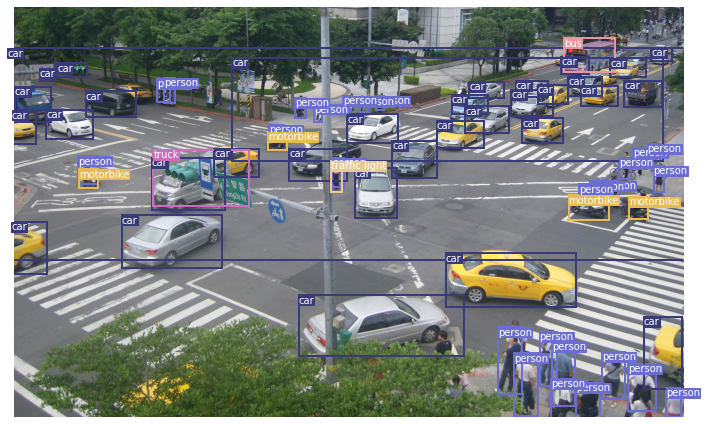

----------------------------------------------------------------


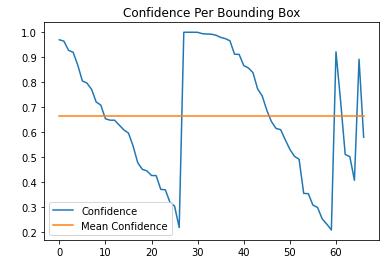

----------------------------------------------------------------


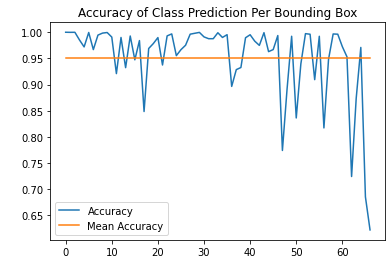

In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

In [ ]:
%pylab inline 
conf_2show, cls_pred_2show = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

----------------------------------------------------------------


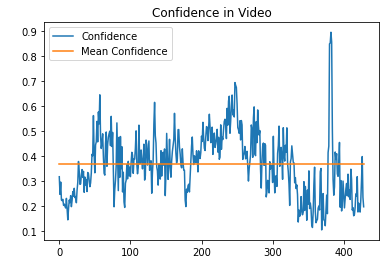

----------------------------------------------------------------


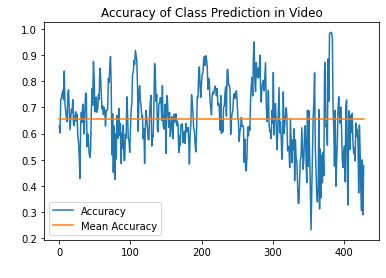

In [ ]:
value_parameters_3(conf_2show, cls_pred_2show)

##### **Confidence Threshold = 0.2 & Non-Max Suppresion Threshold = 0.4**

In [ ]:
## Parameters 
conf_thres=0.2
nms_thres=0.4 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

In [ ]:
%pylab inline 
conf_2show, cls_pred_2show = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

In [ ]:
value_parameters_3(conf_2show, cls_pred_2show)

##### **Confidence Threshold = 0.3 & Non-Max Suppresion Threshold = 0.4**

In [ ]:
## Parameters 
conf_thres=0.3
nms_thres=0.4 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

In [ ]:
%pylab inline 
conf_2show, cls_pred_2show = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

----------------------------------------------------------------


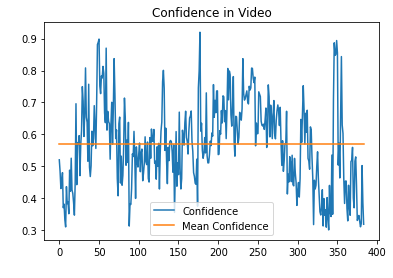

----------------------------------------------------------------


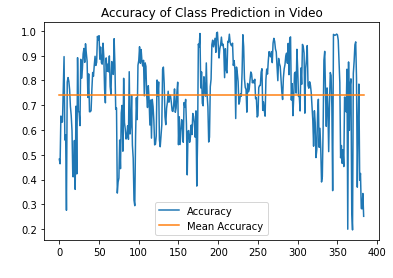

In [ ]:
value_parameters_3(conf_2show, cls_pred_2show)

##### **Συμπεράσματα - Mικρές τιμές του conf_thres, κρατώντας την τιμή για nms_trhes=0.4**

Από τα παραπάνω φαίνεται ότι για μικρές τιμές του confidence threshold το πλήθος των bounding boxes, που εμφανίζονται στην εικόνα, αυξάνεται. Αυτό συμβαίνει γιατί ο αλγόριθμος δέχεται περισσότερα χαμηλοπίθανα bounding boxes. Άμεσο αποτέλεσμα είναι η αύξηση της αβεβαιότητας των bounding boxes, καθώς δεν επιλέγονται με υψηλή πιθανότητα, αλλά και η αύξηση των κλάσεων των αντικειμένων, που αναγνωρίζονται.

Όπως φαίνεται πιο πάνω στην εικόνα η χαμηλή τιμή για το confidence threshold δεν είναι επιθυμητή καθώς αναγνωρίζονται πολλά λανθασμένα αντικείμενα. Από την άλλη η χαμηλή τιμή του confidence threshold στο βίντεο οδηγεί στην αναγνώριση περισσότερων εύστοχων αντικειμένων.



#### **Mεγάλες τιμές του conf_thres , κρατώντας την τιμή για nms_trhes=0.4**


##### **Confidence Threshold = 0.7 & Non-Max Suppresion Threshold = 0.4**

In [ ]:
## Parameters 
conf_thres=0.7
nms_thres=0.4 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

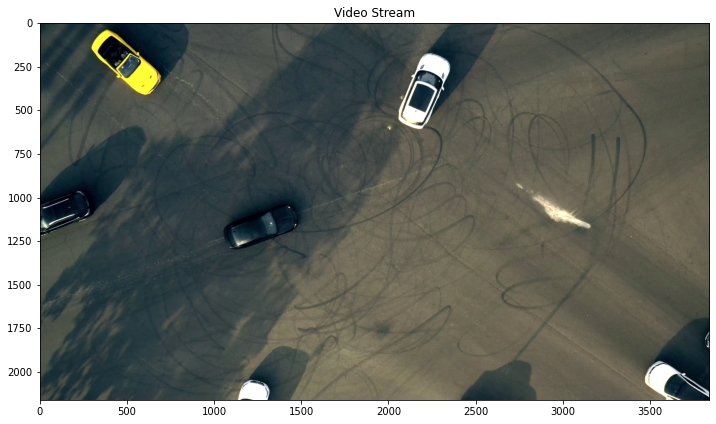

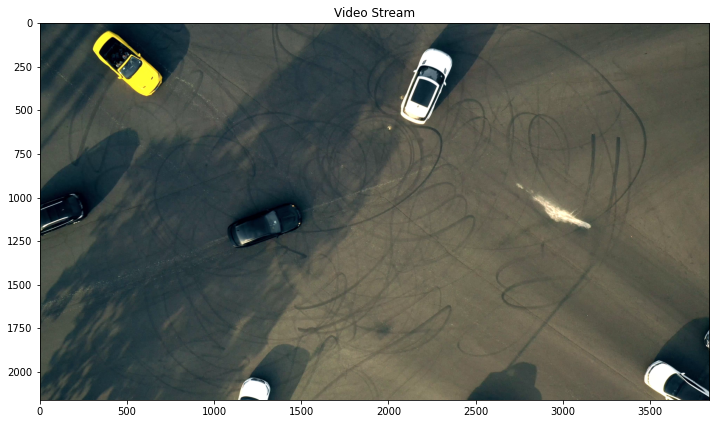

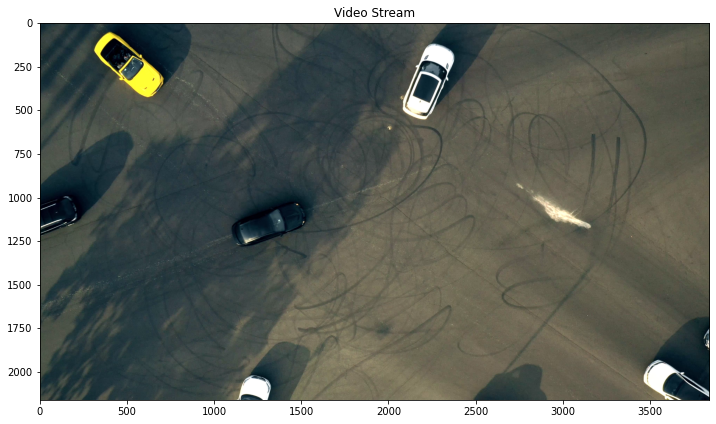

In [ ]:
%pylab inline 
conf_2show, cls_pred_2show = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

----------------------------------------------------------------


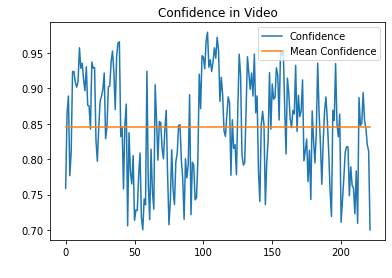

----------------------------------------------------------------


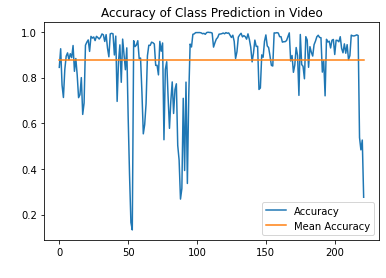

In [ ]:
value_parameters_3(conf_2show, cls_pred_2show)

##### **Confidence Threshold = 0.8 & Non-Max Suppresion Threshold = 0.4**

In [ ]:
## Parameters 
conf_thres=0.8
nms_thres=0.4 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

In [ ]:
%pylab inline 
conf_2show, cls_pred_2show = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

In [ ]:
value_parameters_3(conf_2show, cls_pred_2show)

##### **Confidence Threshold = 0.9 & Non-Max Suppresion Threshold = 0.4**

In [ ]:
## Parameters 
conf_thres=0.9
nms_thres=0.4 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

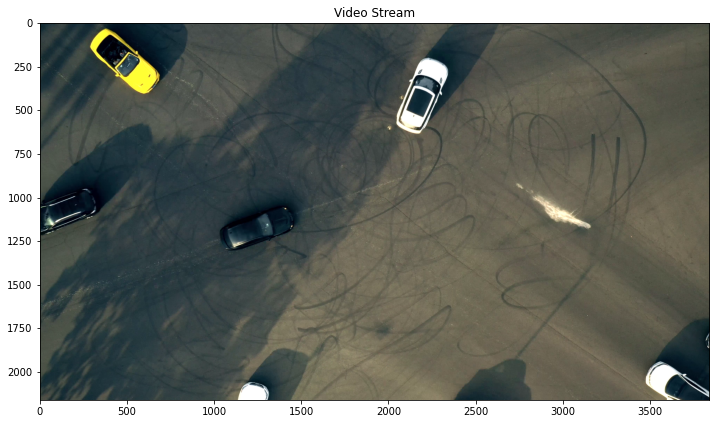

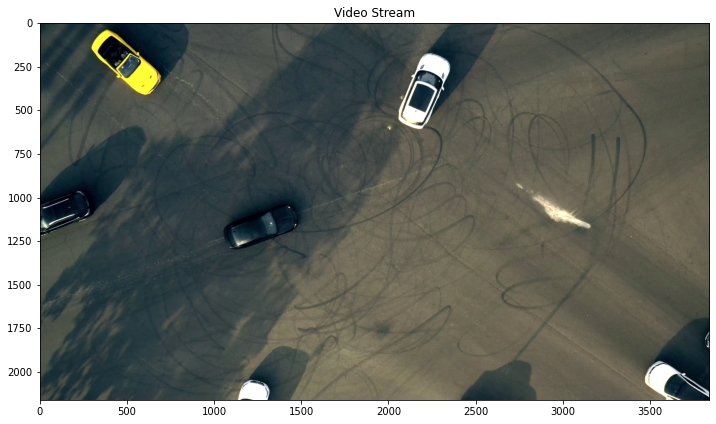

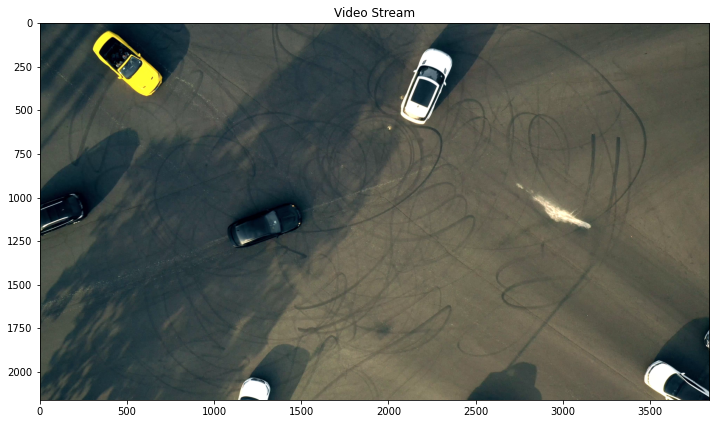

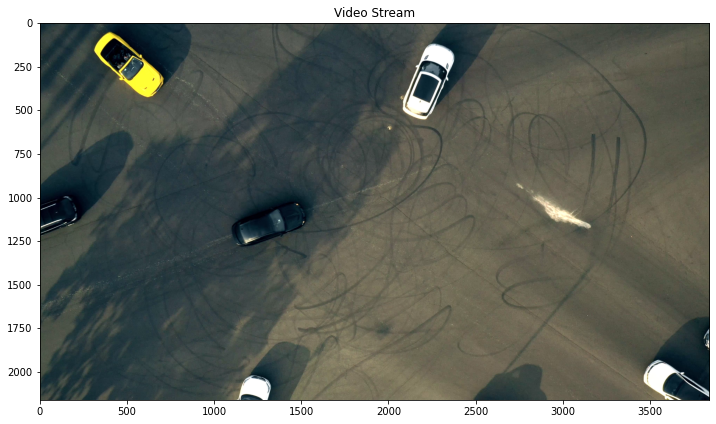

In [ ]:
%pylab inline 
conf_2show, cls_pred_2show = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

----------------------------------------------------------------


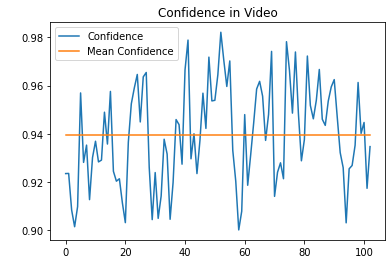

----------------------------------------------------------------


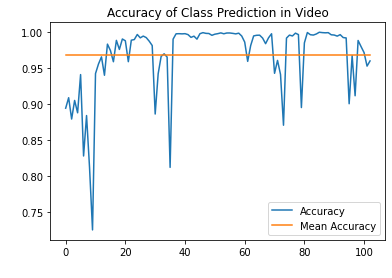

In [ ]:
value_parameters_3(conf_2show, cls_pred_2show)

##### **Συμπεράσματα - Mεγάλες τιμές του conf_thres , κρατώντας την τιμή για nms_trhes=0.4**

Από τα παραπάνω φαίνεται ότι για μεγάλες τιμές του confidence threshold το πλήθος των bounding boxes, που εμφανίζονται στην εικόνα, μειώνεται. Αυτό συμβαίνει γιατί ο αλγόριθμος δε δέχεται χαμηλοπίθανα bounding boxes. Άμεσο αποτέλεσμα είναι η επιλογή πιο σωστων bounding boxes, καθώς επιλέγονται με υψηλή πιθανότητα, αλλά και η μείωση των κλάσεων των αντικειμένων, που αναγνωρίζονται.

Όπως φαίνεται πιο πάνω στην εικόνα η υψηλή τιμή για το confidence threshold είναι επιθυμητή καθώς αναγνωρίζονται λιγότερα αντικείμενα αλλά πιο εύστοχα. Από την άλλη η υψηλή τιμή του confidence threshold στο βίντεο οδηγεί στην αναγνώριση λιγότερων αντικειμένων, με αποτέλεσμα το δίκτυο να μην είναι τόσο αποδοτικό στο βίντεο.


####  **Mικρές τιμές του nms_thres, κρατώντας την τιμή για conf_trhes=0.8**

##### **Confidence Threshold = 0.8 & Non-Max Suppresion Threshold = 0.1**

In [ ]:
## Parameters 
conf_thres=0.8
nms_thres=0.1 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

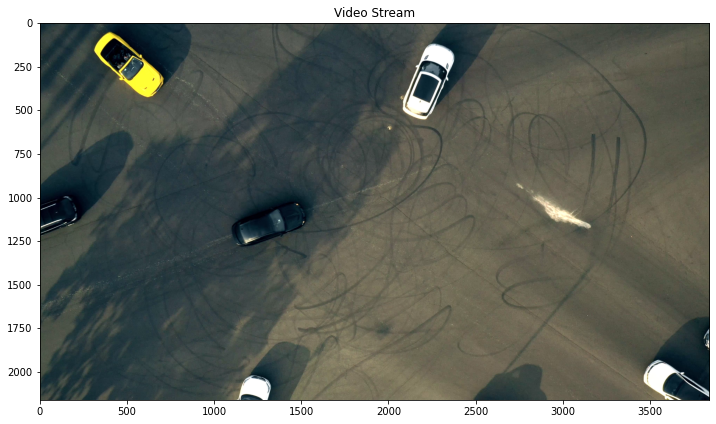

In [ ]:
%pylab inline 
conf_2show, cls_pred_2show = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

----------------------------------------------------------------


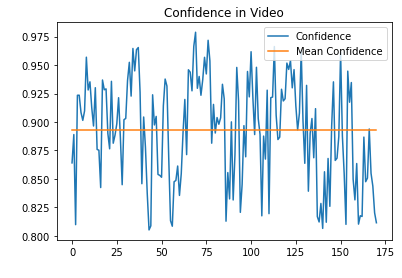

----------------------------------------------------------------


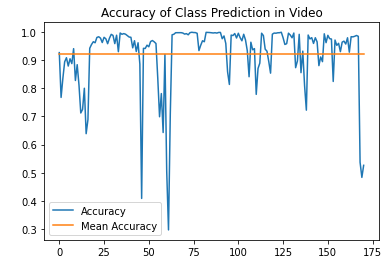

In [ ]:
value_parameters_3(conf_2show, cls_pred_2show)

##### **Confidence Threshold = 0.8 & Non-Max Suppresion Threshold = 0.2**

In [ ]:
## Parameters 
conf_thres=0.8
nms_thres=0.2 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

In [ ]:
%pylab inline 
conf_2show, cls_pred_2show = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

In [ ]:
value_parameters_3(conf_2show, cls_pred_2show)

##### **Confidence Threshold = 0.8 & Non-Max Suppresion Threshold = 0.3**

In [ ]:
## Parameters 
conf_thres=0.8
nms_thres=0.3 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

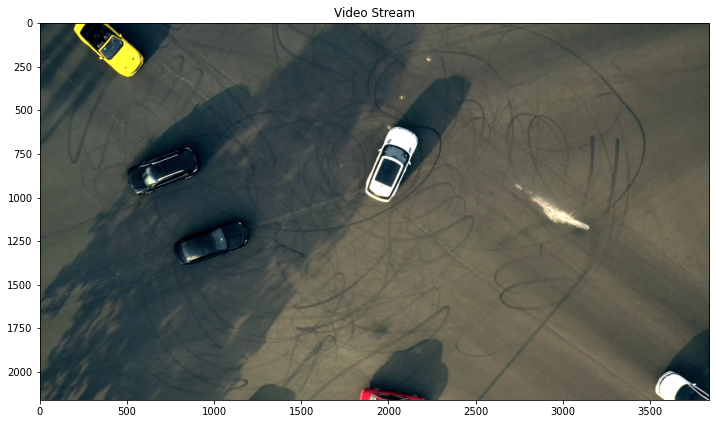

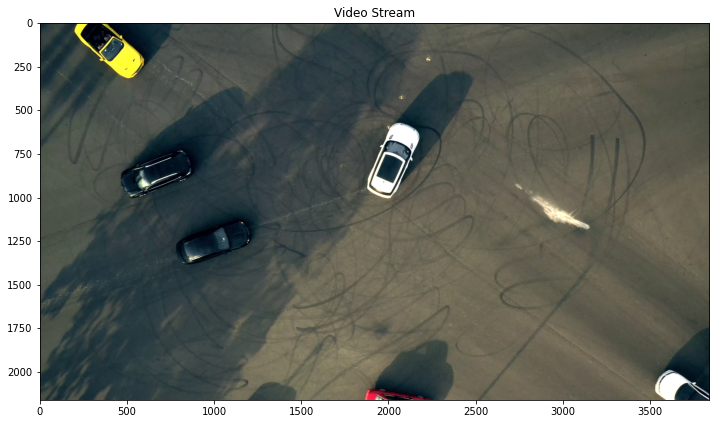

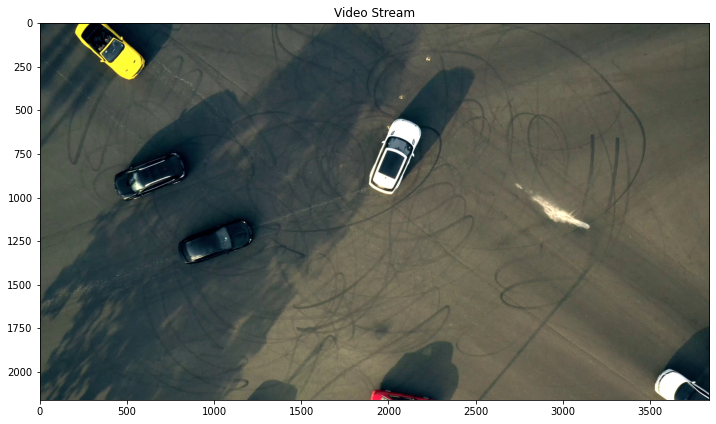

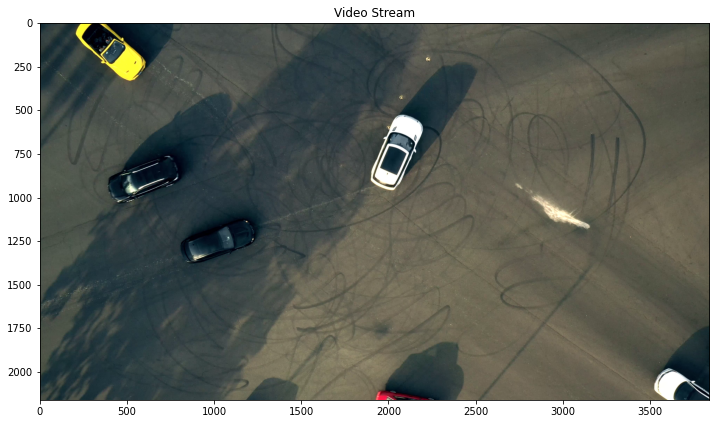

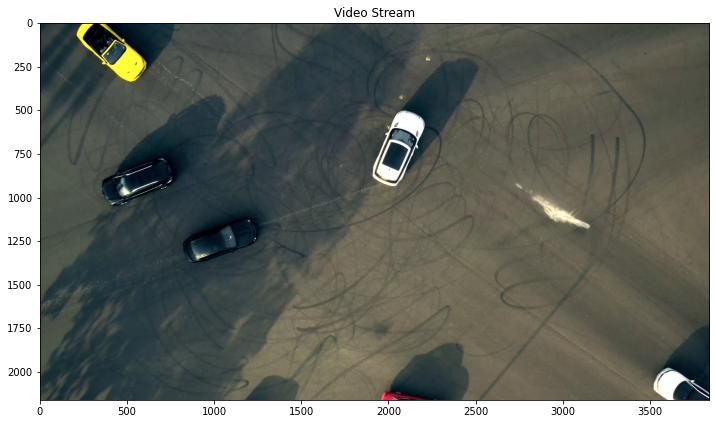

...

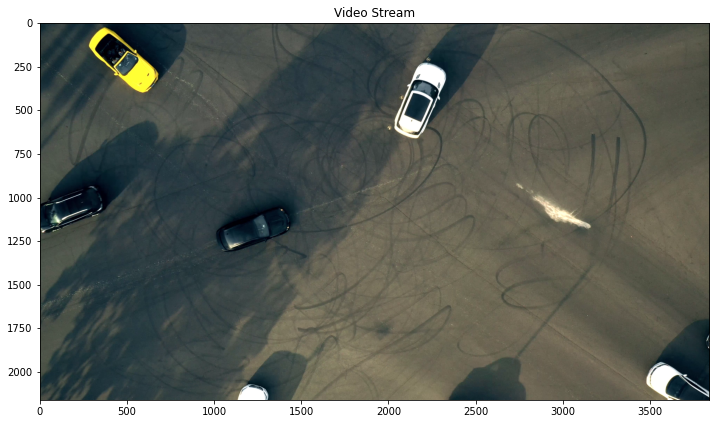

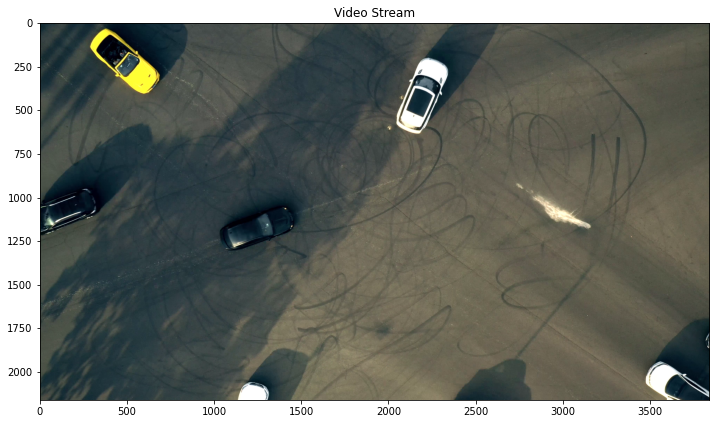

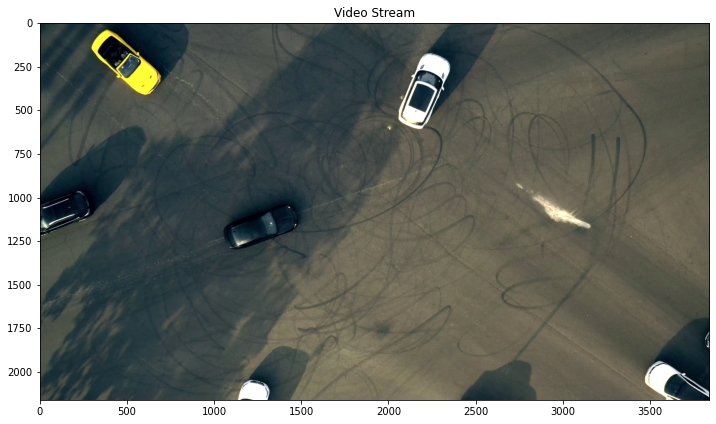

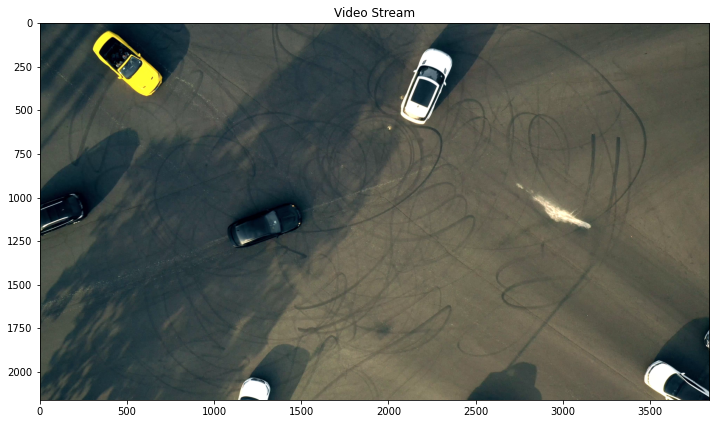

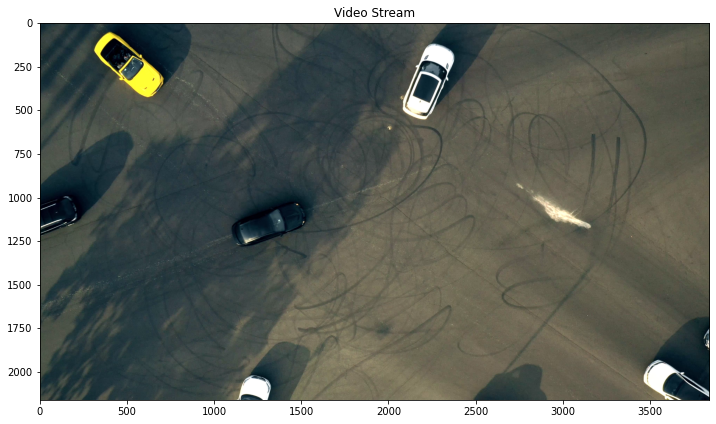

In [ ]:
%pylab inline 
conf_2show, cls_pred_2show = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

----------------------------------------------------------------


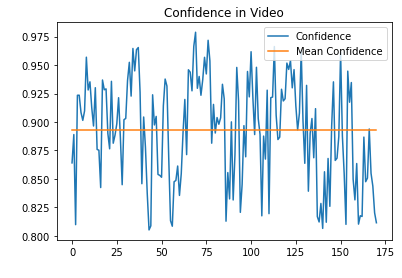

----------------------------------------------------------------


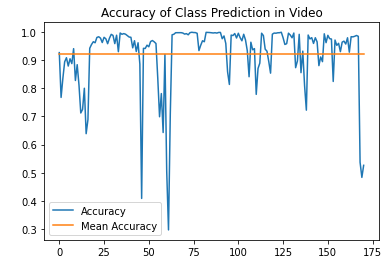

In [ ]:
value_parameters_3(conf_2show, cls_pred_2show)

##### **Συμπεράσματα - Mικρές τιμές του nms_thres, κρατώντας την τιμή για conf_trhes=0.8**

Από τα παραπάνω φαίνεται ότι για μικρές τιμές του non max suppression threshold threshold το πλήθος των bounding boxes, που εμφανίζονται στην εικόνα που απεικονίζουν το ίδιο αντικείμενο, αυξάνεται. Μάλιστα παρατηρείται ότι λόγω αυτών των πολλαπλών ανιχνεύσεων δημιουργούνται και bounding boxes που περιλαμβάνουν περισσότερα από ένα αντικείμενα.

Επιπλέον, όπως φαίνεται η βεβαιότητα στην επιλόγη bounding box είναι υψηλή, ενώ οι τιμές του accuracy για τη βεβαιότητα σωστής ταξινόμησης-αναγνώρισης του αντικειμένου αν και έχει υψηλές διακυμάνσεις είναι και αυτή αρκετά υψηλή


#### **Mεγάλες τιμές του nms_thres, κρατώνταςτην τιμή για conf_trhes=0.8**


##### **Confidence Threshold = 0.8 & Non-Max Suppresion Threshold = 0.7**

In [ ]:
## Parameters 
conf_thres=0.8
nms_thres=0.7 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

In [ ]:
%pylab inline 
conf_2show, cls_pred_2show = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

----------------------------------------------------------------


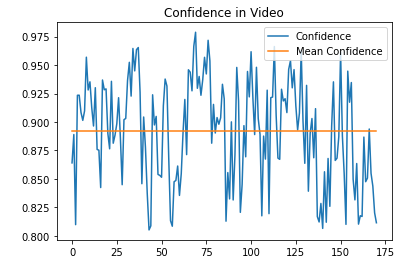

----------------------------------------------------------------


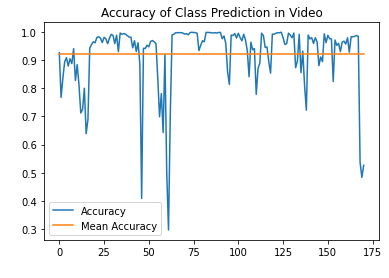

In [ ]:
value_parameters_3(conf_2show, cls_pred_2show)

##### **Confidence Threshold = 0.8 & Non-Max Suppresion Threshold = 0.8**

In [ ]:
## Parameters 
conf_thres=0.8
nms_thres=0.8 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

In [ ]:
%pylab inline 
conf_2show2, cls_pred_2show2 = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

In [ ]:
value_parameters_3(conf_2show2, cls_pred_2show2)

##### **Confidence Threshold = 0.8 & Non-Max Suppresion Threshold = 0.9**

In [ ]:
## Parameters 
conf_thres=0.8
nms_thres=0.9 # NMS threshold

## Load model and weights
net = Darknet(config_path, img_size=img_size)
net.load_weights(weights_path)
net.cuda()
net.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor

/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [ ]:
parameter_tuning_image(image_path, img_size, net, conf_thres, nms_thres)

In [ ]:
%pylab inline 
conf_2show2, cls_pred_2show2 = parameter_tuning_video(video_path, img_size, net, conf_thres, nms_thres)

----------------------------------------------------------------


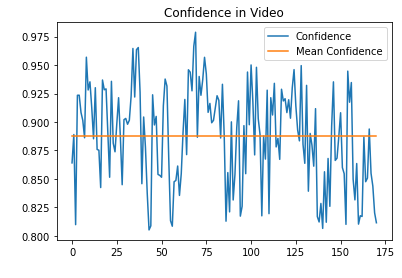

----------------------------------------------------------------


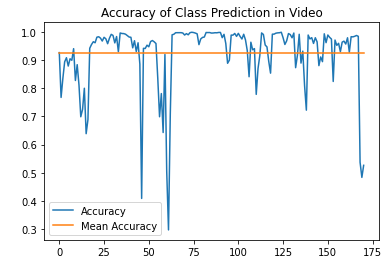

In [ ]:
value_parameters_3(conf_2show2, cls_pred_2show2)

##### **Συμπεράσματα - Mεγάλες τιμές του nms_thres, κρατώνταςτην τιμή για conf_trhes=0.8**

Από τα παραπάνω φαίνεται ότι για μεγάλες τιμές του non max suppression threshold threshold το πλήθος των bounding boxes, που εμφανίζονται στην εικόνα που απεικονίζουν το ίδιο αντικείμενο, μειώνεται. Μάλιστα περιορίζεται η εμφάνιση bounding boxes που περιλαμβάνουν περισσότερα από ένα αντικείμενα.
